# Visualizing Neural Networks

In [156]:
import torch
import torchvision
from torchvision import transforms
import random
import numpy as np
from scipy.ndimage.filters import gaussian_filter1d
import matplotlib.pyplot as plt
from PIL import Image
import warnings
from tqdm import tqdm

# Ignorer tous les avertissements liés à PyTorch
warnings.filterwarnings("ignore")
import os

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'viridis'

## Functions and useful variables

In [2]:
SQUEEZENET_MEAN = np.array([0.485, 0.456, 0.406], dtype=np.float32)
SQUEEZENET_STD = np.array([0.229, 0.224, 0.225], dtype=np.float32)

def preprocess(img, size=224):
    transform = transforms.Compose([
        transforms.Resize(size),
        transforms.ToTensor(),
        transforms.Normalize(mean=SQUEEZENET_MEAN.tolist(),
                    std=SQUEEZENET_STD.tolist()),
        transforms.Lambda(lambda x: x[None]),  # add one dimension
    ])
    return transform(img)

def deprocess(img, should_rescale=True):
    transform = transforms.Compose([
        transforms.Lambda(lambda x: x[0]),
        transforms.Normalize(mean=[0, 0, 0], std=(1.0 / SQUEEZENET_STD).tolist()),
        transforms.Normalize(mean=(-SQUEEZENET_MEAN).tolist(), std=[1, 1, 1]),
        transforms.Lambda(rescale) if should_rescale else transforms.Lambda(lambda x: x),
        transforms.ToPILImage(),
    ])
    return transform(img)

def rescale(x):
    low, high = x.min(), x.max()
    x_rescaled = (x - low) / (high - low)
    return x_rescaled

def blur_image(X, sigma=1):
    X_np = X.cpu().clone().detach().numpy()
    X_np = gaussian_filter1d(X_np, sigma, axis=2)
    X_np = gaussian_filter1d(X_np, sigma, axis=3)
    X.copy_(torch.Tensor(X_np).type_as(X))
    return X

def jitter(X, ox, oy):
    """
    Helper function to randomly jitter an image.

    Inputs
    - X: PyTorch Tensor of shape (N, C, H, W)
    - ox, oy: Integers giving number of pixels to jitter along W and H axes

    Returns: A new PyTorch Tensor of shape (N, C, H, W)
    """
    if ox != 0:
        left = X[:, :, :, :-ox]
        right = X[:, :, :, -ox:]
        X = torch.cat([right, left], dim=3)
    if oy != 0:
        top = X[:, :, :-oy]
        bottom = X[:, :, -oy:]
        X = torch.cat([bottom, top], dim=2)
    return X

## Load the model

For this TME, we will use the Squeezenet model which is a light model pre-trained on ImageNet. This model will be frozen: the goal is not to modify or train the weights but to study them.

In [3]:
# Load the model
model = torchvision.models.squeezenet1_1(pretrained=True)

# Model in test mode
model.eval()

# Freeze the weights
for param in model.parameters():
    param.requires_grad = False

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=SqueezeNet1_1_Weights.IMAGENET1K_V1`. You can also use `weights=SqueezeNet1_1_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/squeezenet1_1-b8a52dc0.pth" to /root/.cache/torch/hub/checkpoints/squeezenet1_1-b8a52dc0.pth
100%|██████████| 4.73M/4.73M [00:00<00:00, 53.4MB/s]


## Load example images

This will fill the variables `X, y, class_names` with 25 examples from the validation set of ImageNet. `X` containes the images, `y` the class index of each image, and `class_names` a dictionary giving the class name from its index.

In [4]:
# Download data
#!wget https://github.com/cdancette/deep-learning-polytech-tp6-7/raw/master/tp9/imagenet_val_25.npz
!wget https://github.com/rdfia/rdfia.github.io/raw/master/data/3-b/imagenet_val_25.npz

--2023-12-25 12:22:31--  https://github.com/rdfia/rdfia.github.io/raw/master/data/3-b/imagenet_val_25.npz
Resolving github.com (github.com)... 140.82.112.4
Connecting to github.com (github.com)|140.82.112.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/rdfia/rdfia.github.io/master/data/3-b/imagenet_val_25.npz [following]
--2023-12-25 12:22:32--  https://raw.githubusercontent.com/rdfia/rdfia.github.io/master/data/3-b/imagenet_val_25.npz
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.110.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3940548 (3.8M) [application/octet-stream]
Saving to: ‘imagenet_val_25.npz’

imagenet_val_25.npz 100%[===================>]   3.76M  --.-KB/s    in 0.09s   

2023-12-25 12:22:32 (40.2 MB/s) - ‘imagenet_val_25.npz’ 

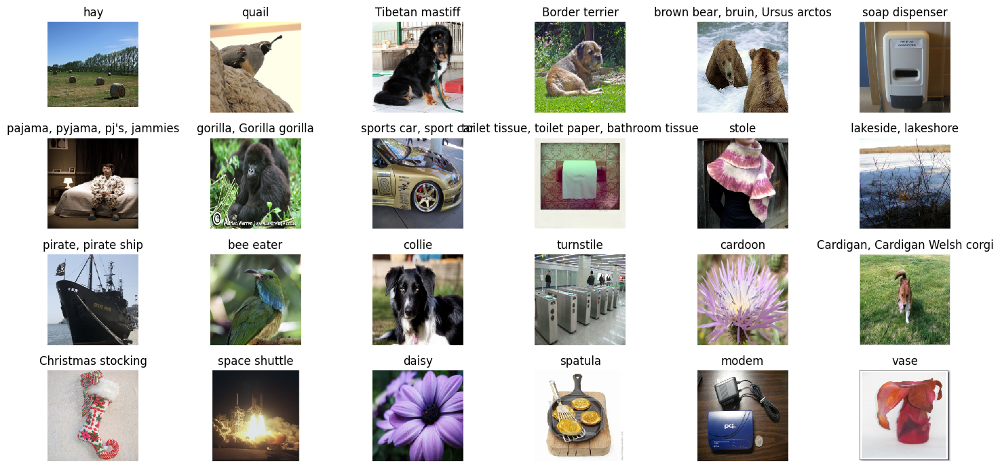

In [253]:
f = np.load("imagenet_val_25.npz", allow_pickle=True)
X, y, class_names = f["X"], f["y"], f["label_map"].item()
class_names_to_id = {name: id for id, name in class_names.items()}

plt.figure(figsize=(15, 7))
for i in range(24):
    plt.subplot(4, 6, i + 1)
    plt.imshow(X[i])
    plt.title(class_names[y[i]])
    plt.axis('off')
plt.gcf().tight_layout()

# Saliency Maps

## Squeezenet

In [6]:
def compute_saliency_maps(X, y, model):
    """
    Compute a class saliency map using the model for images X and labels y.

    Input:
    - X: Input images; Tensor of shape (N, 3, H, W)
    - y: Labels for X; LongTensor of shape (N,)
    - model: A pretrained CNN that will be used to compute the saliency map.

    Returns:
    - saliency: A Tensor of shape (N, H, W) giving the saliency maps for the input
    images.
    """
    # activate gradients on X
    X.requires_grad = True
    saliency = None
    ##############################################################################
    # We will perform a forward and backward pass through #
    # the model to compute the gradient of the correct class score with respect  #
    # to each input image.                                                       #
    # we first want to extract the logits for the correct scores (not the loss),#
    # and then compute the gradients with a backward pass.                       #
    ##############################################################################


    N = X.size(0)

    # pass forward
    xhat = model(X)

    scores = xhat[np.arange(N),y]
    scores = scores.view(-1,1)

    # the gradients are scaled by 1.
    # this is a common practice when we want to backpropagate a scalar value through the computation graph.
    scores.backward(torch.ones_like(scores))

    saliency, _ = torch.max(torch.abs(X.grad), dim=1)

    # Clear the gradients for future computations
    X.grad.data.zero_()

    return saliency

Test your code with the following function:

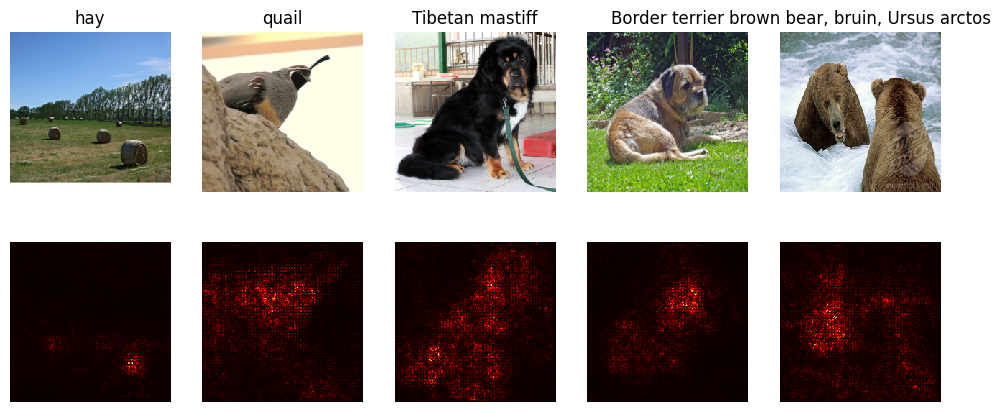

In [7]:
def show_saliency_maps(X, y, model):
    # Convert X and y from numpy arrays to Torch Tensors
    X_tensor = torch.cat([preprocess(Image.fromarray(x)) for x in X], dim=0)
    y_tensor = torch.LongTensor(y)

    # Compute saliency maps for images in X
    saliency = compute_saliency_maps(X_tensor, y_tensor, model)

    # Convert the saliency map from Torch Tensor to numpy array and show images
    # and saliency maps together.
    saliency = saliency.numpy()
    N = X.shape[0]
    for i in range(N):
        plt.subplot(2, N, i + 1)
        plt.imshow(X[i])
        plt.axis('off')
        plt.title(class_names[y[i]])
        plt.subplot(2, N, N + i + 1)
        plt.imshow(saliency[i], cmap=plt.cm.hot)
        plt.axis('off')
        plt.gcf().set_size_inches(12, 5)
    plt.show()

for i in range(1): # range(5) pour tester toutes les images
    show_saliency_maps(X[5*i:5*i+5], y[5*i:5*i+5], model)

## VGG16

In [8]:
vgg16 = torchvision.models.vgg16(pretrained=True)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:06<00:00, 88.7MB/s]


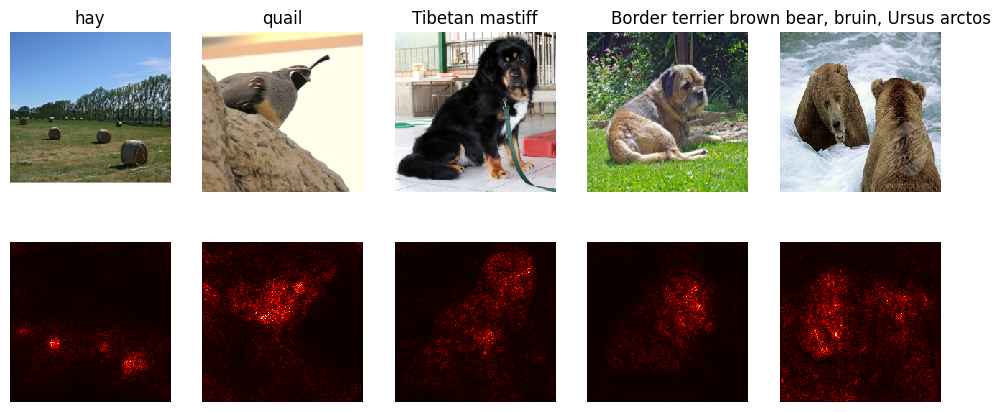

In [9]:
for i in range(1):
    show_saliency_maps(X[5*i:5*i+5], y[5*i:5*i+5], vgg16)

## ResNet50

In [10]:
resnet_model = torchvision.models.resnet50(pretrained=True)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 136MB/s]


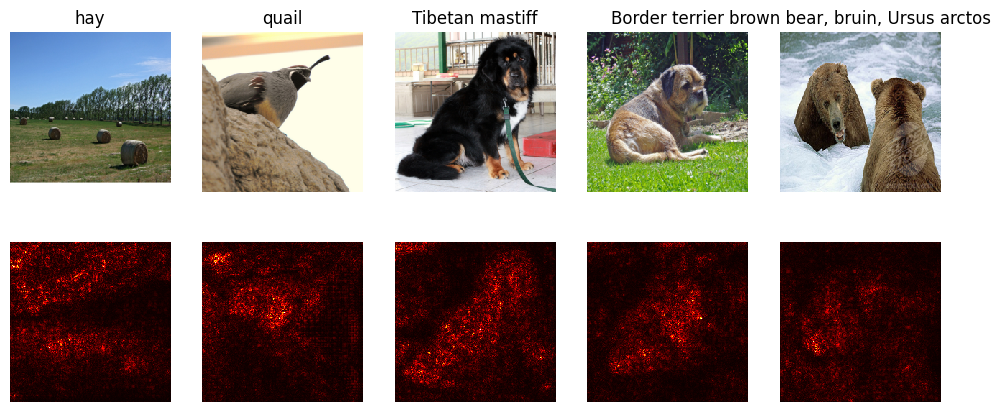

In [11]:
for i in range(1):
    show_saliency_maps(X[5*i:5*i+5], y[5*i:5*i+5], resnet_model)

# Adversarial Examples (Fooling Images)

Calculate an image such that it will be classified in a `target_y` different from the real class (by modifying the image and not the network parameters). See the TP guide for instructions.

**The first two blocks will allow us to perform tests in an interactive way** to write and test our code.

In [12]:
# Initialize tests
X_tensor = torch.Tensor(preprocess(Image.fromarray(X[0])))
target_y = class_names_to_id['stingray']  # Desired class
X_fooling = X_tensor.clone()
X_fooling.requires_grad = True
learning_rate = 1

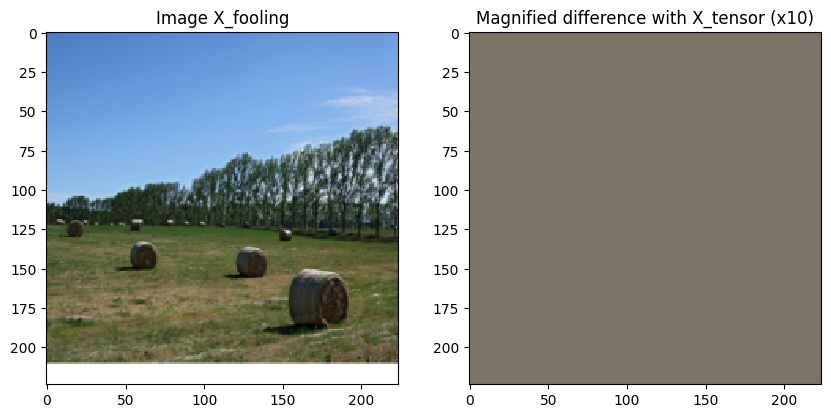

In [13]:
# TODO write your code to test here

# Visualize the image X_folling and its modifications
plt.subplot(1, 2, 1)
plt.imshow(np.asarray(deprocess(X_fooling.clone())).astype(np.uint8))
plt.title("Image X_fooling")
plt.subplot(1, 2, 2)
plt.imshow(np.asarray(deprocess(10* (X_fooling - X_tensor), should_rescale=False)))
plt.title("Magnified difference with X_tensor (x10)")
plt.show()

In [115]:
def make_fooling_image(X, target_y, model):
    """
    Generate a fooling image that is close to X, but that the model classifies
    as target_y.

    Inputs:
    - X: Input image; Tensor of shape (1, 3, 224, 224)
    - target_y: An integer in the range [0, 1000)
    - model: A pretrained CNN

    Returns:
    - X_fooling: An image that is close to X, but that is classifed as target_y
    by the model.
    """
    # Initialize our fooling image to the input image, enable gradients.
    X_fooling = X.clone()
    X_fooling.requires_grad = True

    learning_rate = 1
    ##############################################################################
    # we will generate a fooling image X_fooling that the model will classify as   #
    # the class target_y. We should perform gradient ascent on the score of the #
    # target class, stopping when the model is fooled.                           #
    # When computing an update step, first normalize the gradient:               #
    #   dX = learning_rate * grad / ||grad||_2                                   #
    #                                                                            #
    # We should write a training loop.                                          #
    #                                                                            #
    # HINT: For most examples, we should be able to generate a fooling image    #
    # in fewer than 100 iterations of gradient ascent.                           #
    # We can print your progress over iterations to check your algorithm.       #
    # HINT: Remember to reset gradients at each step                             #
    # HINT: update shouldn't be tracked by the autograd (see for example         #
    # https://pytorch.org/tutorials/beginner/examples_autograd/two_layer_net_autograd.html#sphx-glr-beginner-examples-autograd-two-layer-net-autograd-py #
    ##############################################################################


    N = X.size(0)

    class_changed = False
    i = 0
    niter_max = 100

    # while not convergence
    while not class_changed and i < niter_max :

      # pass forward
      xhat = model(X_fooling)

      scores = xhat[np.arange(N),target_y]
      scores = scores.view(-1,1)

      # the gradients are scaled by 1.
      # this is a common practice when we want to backpropagate a scalar value through the computation graph.
      scores.backward(torch.ones_like(scores))

      X_fooling = X_fooling + learning_rate * (X_fooling.grad / torch.norm(X_fooling.grad))

      # get the predicted class
      # it's not necessary to softmax xhat before applying the argmax
      predicted_class = torch.argmax(model(X_fooling),dim=1).item()

      if predicted_class == target_y : class_changed = True

      if X_fooling.grad is not None:
        X_fooling.grad.data.zero_()
      else:
        X_fooling.retain_grad()

      i += 1


    if i == niter_max:
      print("<--- Adversial Exemple process finished on max iteration condition --->\n")
    else:
      print(f"<--- Adversial Exemple process finished after {i} iterations by finding a suitable image for the target label --->\n")

    return X_fooling

In [287]:
def show_make_fooling_image(model,idx,target_name,FOOLING=make_fooling_image):

    # the target class
    target_y = class_names_to_id[target_name]

    # Preparation of tensor X and it's "fooling" version
    X_tensor = torch.cat([preprocess(Image.fromarray(x)) for x in X], dim=0)
    X_fooling = FOOLING(X_tensor[idx:idx+1], target_y, model)


    # Check the predicted class
    scores = model(X_fooling)
    if FOOLING==make_fooling_image :
      assert target_y == scores.data.max(1)[1][0], 'The model is not fooled!'

    # Display
    X_fooling_np = deprocess(X_fooling.clone())
    X_fooling_np = np.asarray(X_fooling_np).astype(np.uint8)

    plt.subplot(1, 4, 1)
    plt.imshow(X[idx])
    plt.title(class_names[y[idx]])
    plt.axis('off')

    plt.subplot(1, 4, 2)
    plt.imshow(X_fooling_np)
    plt.title(class_names[target_y])
    plt.axis('off')

    plt.subplot(1, 4, 3)
    X_pre = preprocess(Image.fromarray(X[idx]))
    diff = np.asarray(deprocess(X_fooling - X_pre, should_rescale=False))
    plt.imshow(diff)
    plt.title('Difference')
    plt.axis('off')

    plt.subplot(1, 4, 4)
    diff = np.asarray(deprocess(10 * (X_fooling - X_pre), should_rescale=False))
    plt.imshow(diff)
    plt.title('Magnified difference (10x)')
    plt.axis('off')

    plt.gcf().set_size_inches(12, 5)
    plt.show()

## Tests

<--- Adversial Exemple process finished after 13 iterations by finding a suitable image for the target label --->



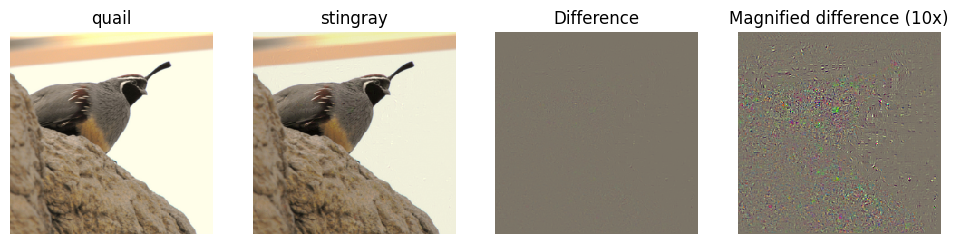

In [207]:
sample = 1
show_make_fooling_image(model,sample,"stingray")

### Bonus : test with different input images and different target classes.

<--- Adversial Exemple process finished after 7 iterations by finding a suitable image for the target label --->



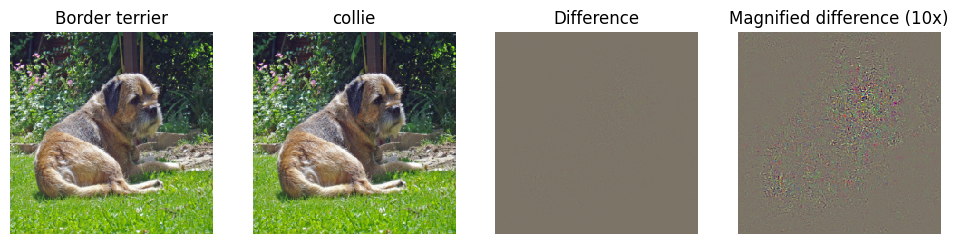

In [137]:
sample = 3
show_make_fooling_image(model,sample,"collie")

<--- Adversial Exemple process finished after 7 iterations by finding a suitable image for the target label --->



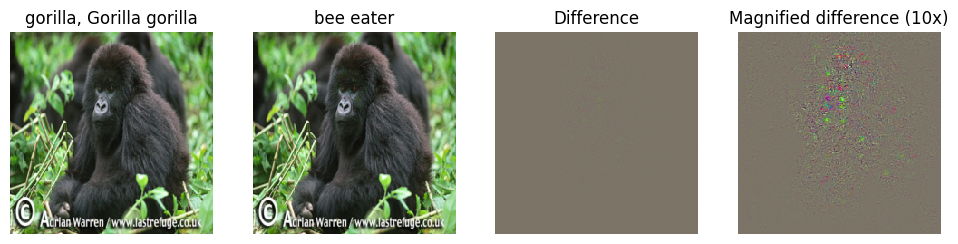

In [288]:
sample = 7
show_make_fooling_image(model,sample,"bee eater")

- ***Limitation***: Adversarial examples crafted for one model may not necessarily fool another model, even if both models are trained on similar data.

- ***Alternative***: Use more advanced methods like iterative attacks or transfer-based attacks, where adversarial examples are generated on one model and transferred to another.

- ***Limitation***: Iterative attacks, where the modification is applied multiple times, can be more potent but may not always improve transferability or fool more robust models.

- ***Alternative***: Explore more sophisticated iterative approaches, such as the Basic Iterative Method (BIM) or Projected Gradient Descent (PGD), which iteratively refine the adversarial example to increase its effectiveness.

- ***Limitation***: Adversarial examples created using the FGSM method are often sensitive to small perturbations, making them less effective in real-world scenarios where noise is present.

- ***Alternative***: Utilize methods like C&W (Carlini and Wagner) attack or DeepFool, which optimize perturbations considering the network's decision boundary and are more robust to noise.

We will explore more sophisticated iterative approache which is ***Projected Gradient Descent PGD*** inspired from this article : https://arxiv.org/pdf/1706.06083.pdf

## Projected Gradient Descent PGD

PGD, or the Projected Gradient Descent algorithm, is a technique used to generate adversarial examples in the field of computer vision. Adversarial examples are slightly modified inputs designed to induce classification errors or alter a model's behavior undesirably.

Here is an explanation of the PGD algorithm for generating adversarial examples:

**Initialization:** The algorithm begins by initializing the adversarial image $X_{\text{adv}}$, often by slightly perturbing the original image $X$.

**Iterations:** The algorithm performs a certain number of iterations to refine the adversarial image. At each iteration, a perturbation is calculated based on the gradient of the cost function with respect to the image. The goal is to minimize classification loss while keeping the image within a certain "norm" or "budget" of perturbation.

The typical update formula at each iteration is:

$X_{\text{adv}}^{(t+1)}$ = $\text{clip}$($X_{\text{adv}}^{(t)}$ + $\alpha$ $\cdot$ $\text{sign}$($\nabla_X$ J($X_{\text{adv}}^{(t)}$, $y_{\text{true}}$)), $X$ - $\epsilon$, $X$ + $\epsilon$)

- $\nabla_X J$ is the gradient of the cost function $J$ with respect to the image $X_{\text{adv}}^{(t)}$.
- $y_{\text{true}}$ is the true label of the image $X$.
- $\alpha$ is the learning rate.
- $\epsilon$ is the maximum allowed perturbation.
- The $\text{clip}$ function ensures that the adversarial image stays within the allowed range.

**Termination:** The algorithm stops after a predefined number of iterations or when certain stopping conditions are met.

The main idea behind PGD is to find an image perturbation that induces a classification error while respecting perturbation constraints. The use of the $\text{clip}$ function ensures that the image stays within certain limits, making the attack more realistic and applicable in real-world scenarios. PGD is often used to evaluate the robustness of computer vision models against adversarial attacks.

In [349]:
def make_fooling_image_PGD(X,target_y, model,learning_rate=1,epsilon=0.01,niter_max = 200):

    # Initialize our fooling image to the input image, enable gradients.
    X_fooling = X.clone()
    X_fooling.requires_grad = True

    N = X.size(0)

    i = 0

    # while not convergence
    while i < niter_max :

      # pass forward
      xhat = model(X_fooling)

      # # y = torch.argmax(model(X_fooling),dim=1).item()
      scores = xhat[np.arange(N),target_y]
      scores = scores.view(-1,1)

      # # the gradients are scaled by 1.
      # # this is a common practice when we want to backpropagate a scalar value through the computation graph.
      scores.backward(torch.ones_like(scores))


      # PGD step: gradient ascent
      # The clamp operation is applied to the perturbation to ensure that after each update,
      # the pixel values remain within the valid range [0, 1]. This is important to maintain the visual interpretability of
      # the generated adversarial example and prevent unrealistic pixel values.
      X_fooling = X_fooling + learning_rate * X_fooling.grad

      # Project the perturbation to ensure epsilon constraint
      perturbation = X_fooling - X
      perturbation.data = torch.clamp(perturbation.data, -epsilon, epsilon)
      X_fooling.data = X + perturbation.data

      # get the predicted class
      # it's not necessary to softmax xhat before applying the argmax
      predicted_class = torch.argmax(model(X_fooling),dim=1).item()

      # print(predicted_class,target_y)

      if predicted_class == target_y : break


      if X_fooling.grad is not None:
        X_fooling.grad.data.zero_()
      else:
        X_fooling.retain_grad()

      i += 1

    if i == niter_max:
      print("<--- Adversial Exemple process finished on max iteration condition --->\n")
    else:
      print(f"<--- Adversial Exemple process finished after {i} iterations by finding a suitable image for the target label --->\n")

    return X_fooling

<--- Adversial Exemple process finished on max iteration condition --->



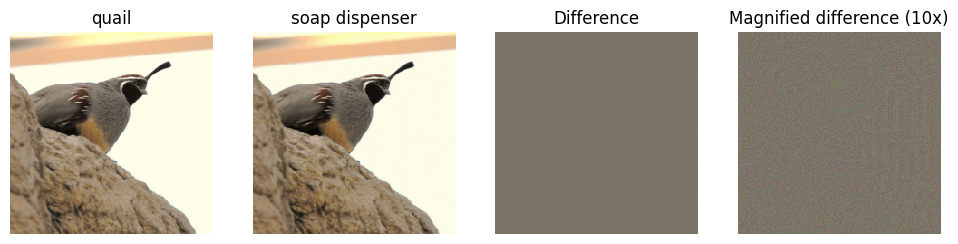

In [350]:
sample = 1
show_make_fooling_image(model,sample,"soap dispenser",make_fooling_image_PGD)

<--- Adversial Exemple process finished on max iteration condition --->



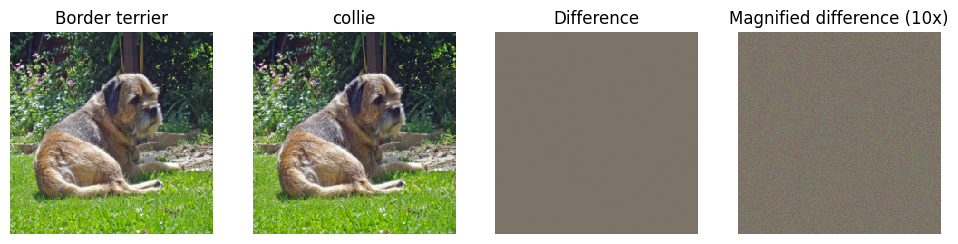

In [347]:
sample = 3
show_make_fooling_image(model,sample,"collie",make_fooling_image_PGD)

<--- Adversial Exemple process finished on max iteration condition --->



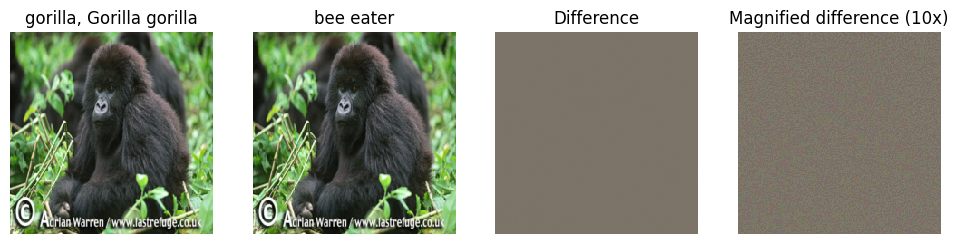

In [348]:
sample = 7
show_make_fooling_image(model,sample,"bee eater",make_fooling_image_PGD)

# Class visualization

In [152]:
def create_class_visualization(target_y, model, dtype, init_img=None, l2_reg=1e-3, learning_rate=5,
                               num_iterations=200, blur_every=10, max_jitter=16, show_every=25,verbose=False):
    """
    Generate an image to maximize the score of target_y under a pretrained model.

    Inputs:
    - target_y: Integer in the range [0, 1000) giving the index of the class
    - model: A pretrained CNN that will be used to generate the image
    - dtype: Torch datatype to use for computations

    Keyword arguments:
    - init_img: Initial image to use (if None, will be random)
    - l2_reg: Strength of L2 regularization on the image
    - learning_rate: How big of a step to take
    - num_iterations: How many iterations to use
    - blur_every: How often to blur the image as an implicit regularizer
    - max_jitter: How much to gjitter the image as an implicit regularizer
    - show_every: How often to show the intermediate result
    """
    model.type(dtype)

    # Randomly initialize the image as a PyTorch Tensor
    if init_img is None:
        img = torch.randn(1, 3, 224, 224).mul_(1.0).type(dtype).detach()
    else:
        img = init_img.clone().mul_(1.0).type(dtype).detach()
    img.requires_grad = True

    for t in range(num_iterations):
        # Randomly jitter the image a bit; this gives slightly nicer results
        ox, oy = random.randint(0, max_jitter), random.randint(0, max_jitter)
        img = (jitter(img, ox, oy)).clone().detach()
        img.requires_grad = True

        ########################################################################
        # We will use the model to compute the gradient of the score for the   #
        # class target_y with respect to the pixels of the image, and make a   #
        # gradient step on the image using the learning rate with #
        # L2 regularization term!                                              #
        # - we must be careful about the signs of elements.          #
        # - we will compute backward on the raw logits (not the loss), it      #
        # works better                                                         #
        ########################################################################



        N = img.size(0)
        xhat = model(img)
        xhat = xhat - l2_reg*torch.norm(img)

        scores = xhat[np.arange(N),target_y]
        scores = scores.view(-1,1)

        # the gradients are scaled by 1.
        # this is a common practice when we want to backpropagate a scalar value through the computation graph.
        scores.backward(torch.ones_like(scores))

        img = img + learning_rate* img.grad

        if img.grad is not None:
          img.grad.data.zero_()
        else:
          img.retain_grad()

        # Undo the random jitter
        img.data.copy_(jitter(img, -ox, -oy))
        img = img.clone()

        # As regularizer, clamp and periodically blur the image
        for c in range(3):
            lo = float(-SQUEEZENET_MEAN[c] / SQUEEZENET_STD[c])
            hi = float((1.0 - SQUEEZENET_MEAN[c]) / SQUEEZENET_STD[c])
            img[:, c].clamp_(min=lo, max=hi)
        if t % blur_every == 0:
            blur_image(img, sigma=0.5)

        # Periodically show the image
        if verbose:
          if t == 0 or (t + 1) % show_every == 0 or t == num_iterations - 1:
              plt.imshow(deprocess(img.clone().cpu()))
              class_name = class_names[target_y]
              plt.title('%s\nIteration %d / %d' % (class_name, t + 1, num_iterations))
              plt.gcf().set_size_inches(4, 4)
              plt.axis('off')
              plt.show()

    return deprocess(img.cpu())

Test with various classes and starting from random noise:

In [153]:
dtype = torch.FloatTensor
# dtype = torch.cuda.FloatTensor # Uncomment this to use GPU
model.type(dtype)

# target_y = 76 # Tarantula
# target_y = 78 # Tick
# target_y = 187 # Yorkshire Terrier
# target_y = 683 # Oboe
target_y = 366 # Gorilla
# target_y = 604 # Hourglass
# target_y = 113 # Snail
# target_y = np.random.randint(1000) # Classe aléatoire
out = create_class_visualization(target_y, model, dtype, show_every=25, num_iterations=200)

## Number of iteration : Gorilla

5it [01:51, 22.35s/it]


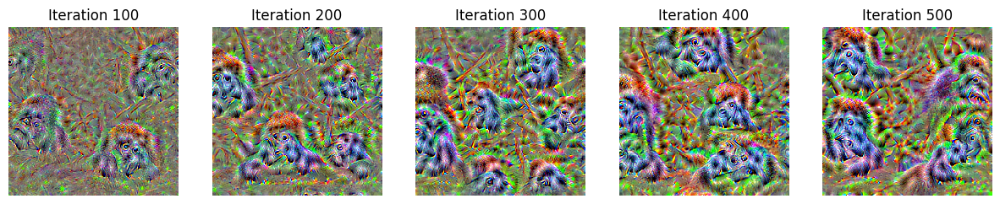

In [157]:
dtype = torch.FloatTensor
model.type(dtype)
target_y = 366 # Gorilla

iterations = [100,200,300,400,500]

plt.figure(figsize=(15,10))

for i,itera in tqdm(enumerate(iterations)):
  out = create_class_visualization(target_y, model, dtype, show_every=25, num_iterations=itera)
  plt.subplot(1,5,i+1)
  plt.title(f"Iteration {itera}")
  plt.axis('off')
  plt.imshow(out)


plt.show()

## Learning rate : Gorilla

6it [01:21, 13.56s/it]


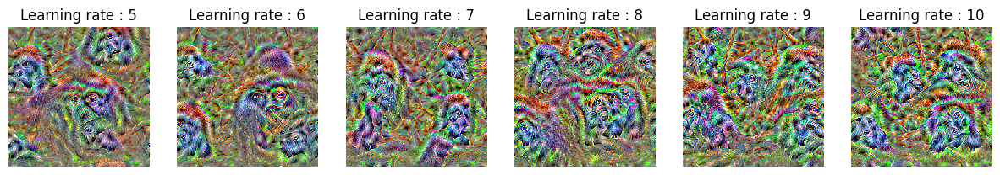

In [159]:
dtype = torch.FloatTensor
model.type(dtype)
target_y = 366 # Gorilla

rates = [5,6,7,8,9,10]

plt.figure(figsize=(15,10))

for i,rate in tqdm(enumerate(rates)):
  out = create_class_visualization(target_y, model, dtype, show_every=25, num_iterations=200,learning_rate=rate)
  plt.subplot(1,len(rates),i+1)
  plt.title(f"Learning rate : {rate}")
  plt.axis('off')
  plt.imshow(out)

plt.show()

## Regularization weight : Gorilla

6it [01:19, 13.20s/it]


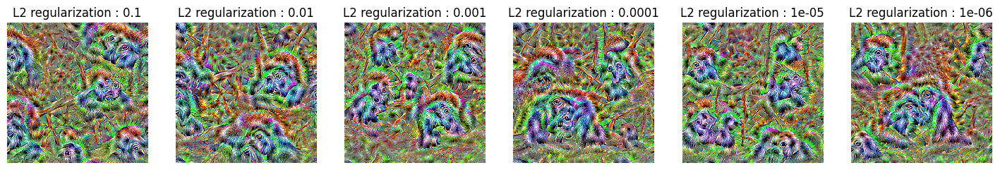

In [161]:
dtype = torch.FloatTensor
model.type(dtype)
target_y = 366 # Gorilla

regus = [1e-1,1e-2,1e-3,1e-4,1e-5,1e-6]

plt.figure(figsize=(18,10))

for i,reg in tqdm(enumerate(regus)):
  out = create_class_visualization(target_y, model, dtype, show_every=25, num_iterations=200,learning_rate=10,l2_reg=reg)
  plt.subplot(1,len(regus),i+1)
  plt.title(f"L2 regularization : {reg}")
  plt.axis('off')
  plt.imshow(out)

plt.show()

## Starting from an Image

Test by starting from an image from ImageNet:

3it [03:57, 79.09s/it]


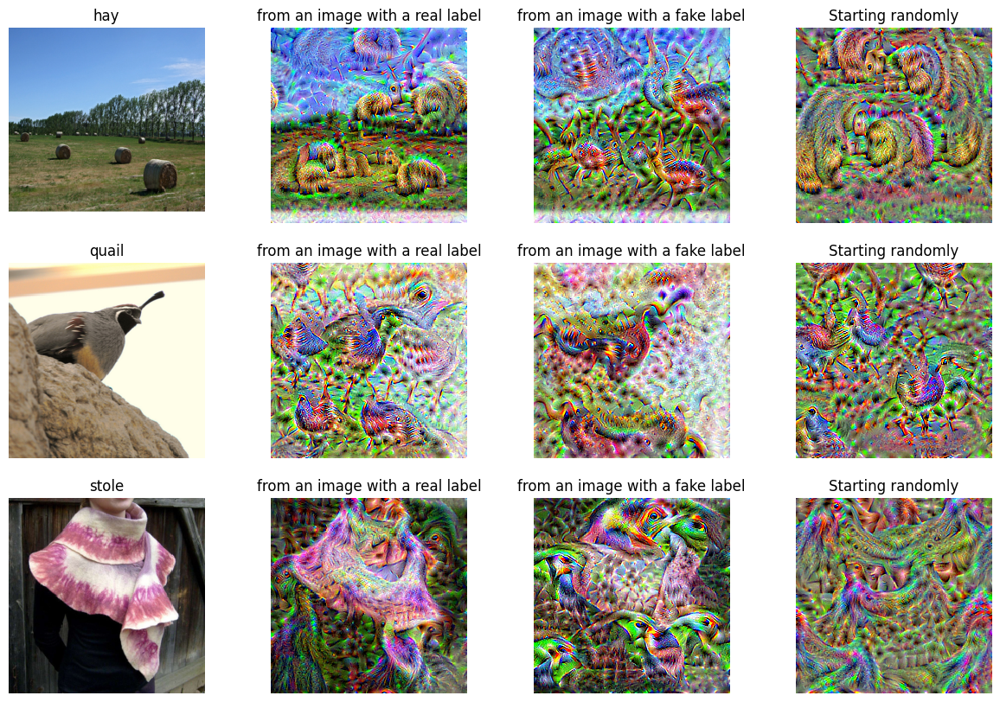

In [182]:
inputs = [(0,class_names_to_id['hay'],113),(1,class_names_to_id['quail'],110),(10,class_names_to_id['stole'],96)]

plt.figure(figsize=(15,10))

for i,input in tqdm(enumerate(inputs)):
    img_ind , target_y , fake_target_y = input


    plt.subplot(3,4,1+i*4)
    plt.title(class_names[target_y])
    plt.axis('off')
    plt.imshow(X[img_ind])

    X_tensor = torch.Tensor(preprocess(Image.fromarray(X[img_ind])))
    out = create_class_visualization(target_y, model, dtype, init_img=X_tensor, show_every=25, num_iterations=400)
    plt.subplot(3,4,2+i*4)
    plt.title("from an image with a real label")
    plt.axis('off')
    plt.imshow(out)


    X_tensor = torch.Tensor(preprocess(Image.fromarray(X[img_ind])))
    out = create_class_visualization(fake_target_y, model, dtype, init_img=X_tensor, show_every=25, num_iterations=400)
    plt.subplot(3,4,3+i*4)
    plt.title("from an image with a fake label")
    plt.axis('off')
    plt.imshow(out)

    out = create_class_visualization(target_y, model, dtype, init_img=None, show_every=25, num_iterations=400)
    plt.subplot(3,4,4+i*4)
    plt.title("Starting randomly")
    plt.axis('off')
    plt.imshow(out)

plt.show()

## Bonus

## With VGG16

3it [16:45, 335.12s/it]


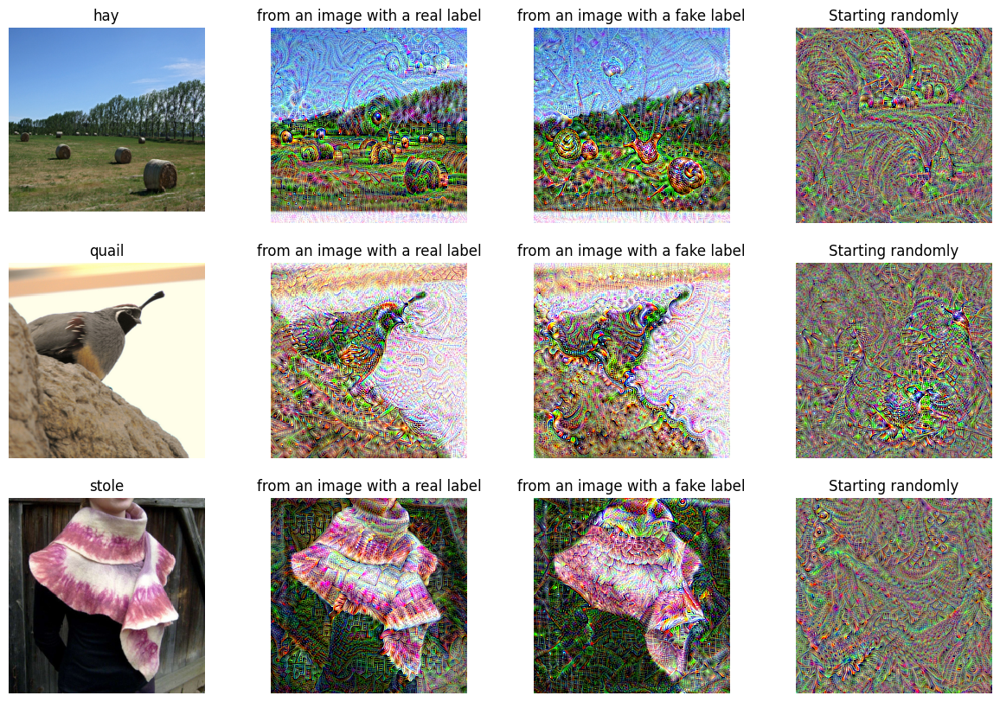

In [185]:
inputs = [(0,class_names_to_id['hay'],113),(1,class_names_to_id['quail'],110),(10,class_names_to_id['stole'],96)]

plt.figure(figsize=(15,10))

for i,input in tqdm(enumerate(inputs)):
    img_ind , target_y , fake_target_y = input


    plt.subplot(3,4,1+i*4)
    plt.title(class_names[target_y])
    plt.axis('off')
    plt.imshow(X[img_ind])

    X_tensor = torch.Tensor(preprocess(Image.fromarray(X[img_ind])))
    out = create_class_visualization(target_y, vgg16, dtype, init_img=X_tensor, show_every=25, num_iterations=50)
    plt.subplot(3,4,2+i*4)
    plt.title("from an image with a real label")
    plt.axis('off')
    plt.imshow(out)


    X_tensor = torch.Tensor(preprocess(Image.fromarray(X[img_ind])))
    out = create_class_visualization(fake_target_y, vgg16, dtype, init_img=X_tensor, show_every=25, num_iterations=50)
    plt.subplot(3,4,3+i*4)
    plt.title("from an image with a fake label")
    plt.axis('off')
    plt.imshow(out)

    out = create_class_visualization(target_y, vgg16, dtype, init_img=None, show_every=25, num_iterations=50)
    plt.subplot(3,4,4+i*4)
    plt.title("Starting randomly")
    plt.axis('off')
    plt.imshow(out)

plt.show()

## Regularization impact

3it [05:34, 111.44s/it]


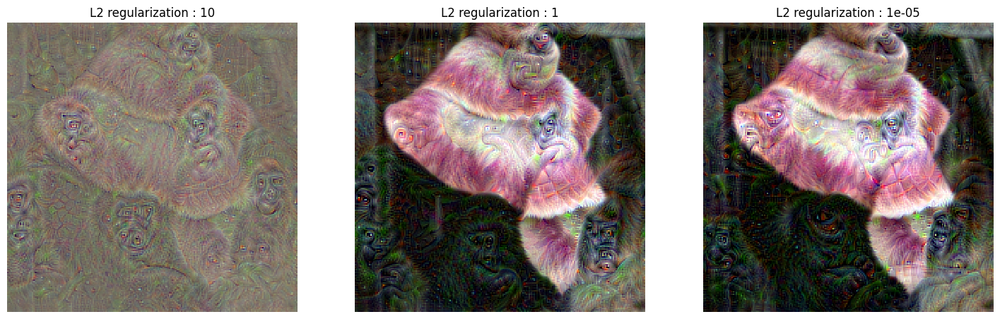

In [355]:
dtype = torch.FloatTensor
model.type(dtype)
target_y = 366 # Gorilla


img_ind = 10
regus = [10,1,1e-5]
X_tensor = torch.Tensor(preprocess(Image.fromarray(X[img_ind])))


plt.figure(figsize=(18,10))

for i,reg in tqdm(enumerate(regus)):

  out = create_class_visualization(target_y, vgg16, dtype, init_img=X_tensor,show_every=25, num_iterations=50,learning_rate=1,l2_reg=reg)
  plt.subplot(1,len(regus),i+1)
  plt.title(f"L2 regularization : {reg}")
  plt.axis('off')
  plt.imshow(out)

plt.show()